# Import Libraries

In [20]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import confusion_matrix
import seaborn as sns


# Data Preparing

## Train and Test data 

In [2]:
train_df = pd.read_csv('./processed_data/trainset.csv')
test_df = pd.read_csv('./processed_data/testset.csv')

date_time = pd.to_datetime(test_df.pop('Formatted Date'), format='%Y-%m-%d %H:%M:%S.%f %z')
train_df.drop(['Formatted Date'],axis=1,inplace=True)

n_feature = train_df.shape[1]
n_feature

39

In [3]:
train_df.shape

(66467, 39)

## Data Setup

In [4]:
# train_X = train_df
# train_y = train_df['Temperature (C)']
# val_X = test_df
# val_y = test_df['Temperature (C)']
# train_X.drop(train_X.index[-1], inplace=True)
# train_y = train_y.drop(train_y.index[0])
# val_X.drop(val_X.index[-1], inplace=True)
# val_y = val_y.drop(val_y.index[0])

train_X = train_df
val_X = test_df
feature_name = []

# prepare train_y and val_y for each feature
train_y = []
for column_name in train_df:
   column_data = train_df[column_name]
   feature_name.append(column_name)
   train_y.append(column_data.values)
val_y = []
for column_name in test_df:
   column_data = test_df[column_name]
   val_y.append(column_data.values)

In [5]:
print(len(feature_name))
print(len(train_y))

39
39


In [6]:
train_X.drop(train_X.index[-1], inplace=True)
val_X.drop(val_X.index[-1], inplace=True)
ft_len = len(feature_name)
for i in range(0, ft_len):
   train_y[i] = train_y[i][1:]
   val_y[i] = val_y[i][1:]
train_X

,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Visibility (km),Pressure (millibars),Summary_Breezy,Summary_Breezy and Dry,Summary_Breezy and Foggy,Summary_Breezy and Mostly Cloudy,...,Summary_Windy and Foggy,Summary_Windy and Mostly Cloudy,Summary_Windy and Overcast,Summary_Windy and Partly Cloudy,Wx,Wy,Day sin,Day cos,Year sin,Year cos
0,0,0.577778,-4.050000,0.89,9.9820,1016.66,False,False,False,False,...,False,False,False,False,-13.110314,11.000860,-2.588190e-01,9.659258e-01,0.003928,0.999992
1,0,1.161111,-3.238889,0.85,9.9015,1016.15,False,False,False,False,...,False,False,False,False,-12.539651,10.900552,1.845594e-12,1.000000e+00,0.004645,0.999989
2,0,1.666667,-3.155556,0.82,9.9015,1015.87,False,False,False,False,...,False,False,False,False,-15.515311,13.018892,2.588190e-01,9.659258e-01,0.005362,0.999986
3,0,1.711111,-2.194444,0.82,9.9015,1015.56,False,False,False,False,...,False,False,False,False,-11.099984,9.313992,5.000000e-01,8.660254e-01,0.006078,0.999982
4,0,1.183333,-2.744444,0.86,9.9015,1014.98,False,False,False,False,...,False,False,False,False,-9.685344,10.029467,7.071068e-01,7.071068e-01,0.006795,0.999977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66461,0,15.994444,15.994444,0.93,11.2056,1017.45,False,False,False,False,...,False,False,False,False,1.646910,-7.748103,8.660254e-01,5.000000e-01,-0.480223,-0.877146
66462,0,18.755556,18.755556,0.78,11.2056,1017.36,False,False,False,False,...,False,False,False,False,6.968323,-5.847117,9.659258e-01,2.588190e-01,-0.480852,-0.876802
66463,0,20.955556,20.955556,0.65,10.3523,1017.63,False,False,False,False,...,False,False,False,False,6.676848,-6.914078,1.000000e+00,5.829502e-12,-0.481480,-0.876457
66464,0,23.772222,23.772222,0.58,9.9820,1017.65,False,False,False,False,...,False,False,False,False,6.280661,-6.975380,9.659258e-01,-2.588190e-01,-0.482108,-0.876112


# Build Models

## Single Feature


In [7]:
models = []

## All Features

In [8]:
train_df = pd.read_csv('./processed_data/trainset.csv')
test_df = pd.read_csv('./processed_data/testset.csv')

date_time = pd.to_datetime(test_df.pop('Formatted Date'), format='%Y-%m-%d %H:%M:%S.%f %z')
train_df.drop(['Formatted Date'],axis=1,inplace=True)

train_all_features_y = train_df
val_all_features_y = test_df
train_all_features_y.drop(train_all_features_y.index[0], inplace=True)
val_all_features_y.drop(val_all_features_y.index[0], inplace=True)
train_X

,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Visibility (km),Pressure (millibars),Summary_Breezy,Summary_Breezy and Dry,Summary_Breezy and Foggy,Summary_Breezy and Mostly Cloudy,...,Summary_Windy and Foggy,Summary_Windy and Mostly Cloudy,Summary_Windy and Overcast,Summary_Windy and Partly Cloudy,Wx,Wy,Day sin,Day cos,Year sin,Year cos
0,0,0.577778,-4.050000,0.89,9.9820,1016.66,False,False,False,False,...,False,False,False,False,-13.110314,11.000860,-2.588190e-01,9.659258e-01,0.003928,0.999992
1,0,1.161111,-3.238889,0.85,9.9015,1016.15,False,False,False,False,...,False,False,False,False,-12.539651,10.900552,1.845594e-12,1.000000e+00,0.004645,0.999989
2,0,1.666667,-3.155556,0.82,9.9015,1015.87,False,False,False,False,...,False,False,False,False,-15.515311,13.018892,2.588190e-01,9.659258e-01,0.005362,0.999986
3,0,1.711111,-2.194444,0.82,9.9015,1015.56,False,False,False,False,...,False,False,False,False,-11.099984,9.313992,5.000000e-01,8.660254e-01,0.006078,0.999982
4,0,1.183333,-2.744444,0.86,9.9015,1014.98,False,False,False,False,...,False,False,False,False,-9.685344,10.029467,7.071068e-01,7.071068e-01,0.006795,0.999977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66461,0,15.994444,15.994444,0.93,11.2056,1017.45,False,False,False,False,...,False,False,False,False,1.646910,-7.748103,8.660254e-01,5.000000e-01,-0.480223,-0.877146
66462,0,18.755556,18.755556,0.78,11.2056,1017.36,False,False,False,False,...,False,False,False,False,6.968323,-5.847117,9.659258e-01,2.588190e-01,-0.480852,-0.876802
66463,0,20.955556,20.955556,0.65,10.3523,1017.63,False,False,False,False,...,False,False,False,False,6.676848,-6.914078,1.000000e+00,5.829502e-12,-0.481480,-0.876457
66464,0,23.772222,23.772222,0.58,9.9820,1017.65,False,False,False,False,...,False,False,False,False,6.280661,-6.975380,9.659258e-01,-2.588190e-01,-0.482108,-0.876112


In [9]:
d_tree = DecisionTreeRegressor()
d_tree.fit(train_X, train_all_features_y)

DecisionTreeRegressor()

In [10]:
train_df

,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Visibility (km),Pressure (millibars),Summary_Breezy,Summary_Breezy and Dry,Summary_Breezy and Foggy,Summary_Breezy and Mostly Cloudy,...,Summary_Windy and Foggy,Summary_Windy and Mostly Cloudy,Summary_Windy and Overcast,Summary_Windy and Partly Cloudy,Wx,Wy,Day sin,Day cos,Year sin,Year cos
1,0,1.161111,-3.238889,0.85,9.9015,1016.15,False,False,False,False,...,False,False,False,False,-12.539651,10.900552,1.845594e-12,1.000000e+00,0.004645,0.999989
2,0,1.666667,-3.155556,0.82,9.9015,1015.87,False,False,False,False,...,False,False,False,False,-15.515311,13.018892,2.588190e-01,9.659258e-01,0.005362,0.999986
3,0,1.711111,-2.194444,0.82,9.9015,1015.56,False,False,False,False,...,False,False,False,False,-11.099984,9.313992,5.000000e-01,8.660254e-01,0.006078,0.999982
4,0,1.183333,-2.744444,0.86,9.9015,1014.98,False,False,False,False,...,False,False,False,False,-9.685344,10.029467,7.071068e-01,7.071068e-01,0.006795,0.999977
5,0,1.205556,-3.072222,0.85,9.9820,1014.08,False,False,False,False,...,False,False,False,False,-13.634789,8.192608,8.660254e-01,5.000000e-01,0.007512,0.999972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66462,0,18.755556,18.755556,0.78,11.2056,1017.36,False,False,False,False,...,False,False,False,False,6.968323,-5.847117,9.659258e-01,2.588190e-01,-0.480852,-0.876802
66463,0,20.955556,20.955556,0.65,10.3523,1017.63,False,False,False,False,...,False,False,False,False,6.676848,-6.914078,1.000000e+00,5.829502e-12,-0.481480,-0.876457
66464,0,23.772222,23.772222,0.58,9.9820,1017.65,False,False,False,False,...,False,False,False,False,6.280661,-6.975380,9.659258e-01,-2.588190e-01,-0.482108,-0.876112
66465,0,24.977778,24.977778,0.50,11.2056,1017.55,False,False,False,False,...,False,False,False,False,9.690724,-0.169152,8.660254e-01,-5.000000e-01,-0.482736,-0.875766


# Train

In [11]:
for i in range(0, ft_len):
   models.append(DecisionTreeRegressor())

In [12]:
for i in range(0, ft_len):
   model = models[i]
   model.fit(train_X, train_y[i])

# Evaluate

In [13]:
from sklearn.metrics import mean_absolute_error

## Evaluate d_tree model

In [14]:
# Temperature
predict_all_features = d_tree.predict(val_X)



### Precip Type

In [15]:
rain = predict_all_features[:,0] < 0.5
snow = predict_all_features[:,0] >= 0.5
predict_all_features[rain,0] = 0
predict_all_features[snow,0] = 1

In [16]:
BA = keras.metrics.BinaryAccuracy(threshold=0.5)
BA.update_state(val_all_features_y.iloc[:,0], predict_all_features[:,0])
R_Accuracy = float(BA.result())
print('Độ chính xác khi dự đoán mưa hay không: {:.2f}%'.format(R_Accuracy*100))

Độ chính xác khi dự đoán mưa hay không: 96.88%


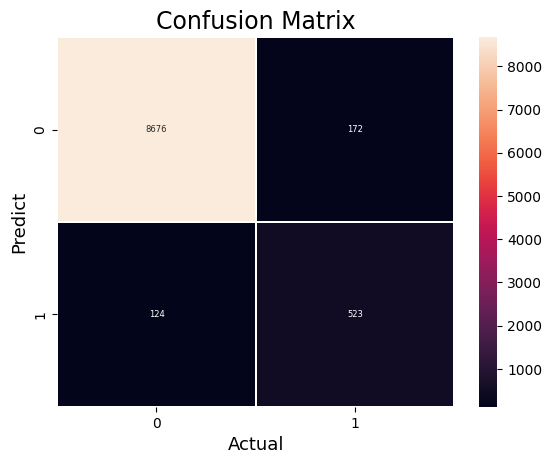

In [21]:
# compute the confusion matrix
cm = confusion_matrix(val_all_features_y.iloc[:,0], predict_all_features[:,0])
 
#Plot the confusion matrix.
sns.heatmap(cm,
            annot=True,
            fmt='g',
            linewidths= 0.2,
            annot_kws={"size": 6})
plt.xlabel('Actual',fontsize=13)
plt.ylabel('Predict',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)

plt.show()

### Temperature

In [22]:
# mean absolute error
temperature_mean = float(mean_absolute_error(val_all_features_y.iloc[:,1], predict_all_features[:,1]))
print('Độ lệch trung bình là: {:.3f}'.format(temperature_mean))

Độ lệch trung bình là: 1.627


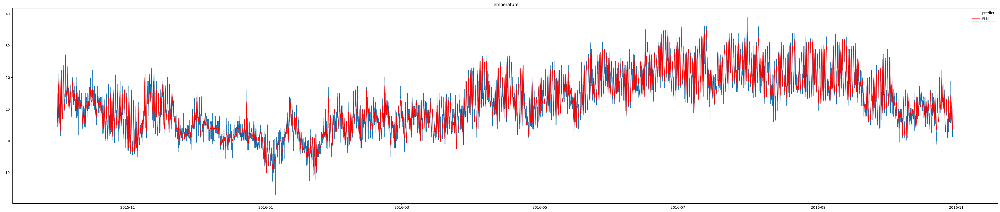

In [24]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[1:], predict_all_features[:,1], label='predict')
plt.plot(date_time[1:], val_all_features_y.iloc[:,1], c='red', label='real')
plt.title('Temperature')
plt.legend()

### Apprarent Temperature

In [25]:
# mean absolute error
apparent_temperature_mean = float(mean_absolute_error(val_all_features_y.iloc[:,2], predict_all_features[:,2]))
print('Độ lệch trung bình là: {:.3f}'.format(apparent_temperature_mean))

Độ lệch trung bình là: 1.897


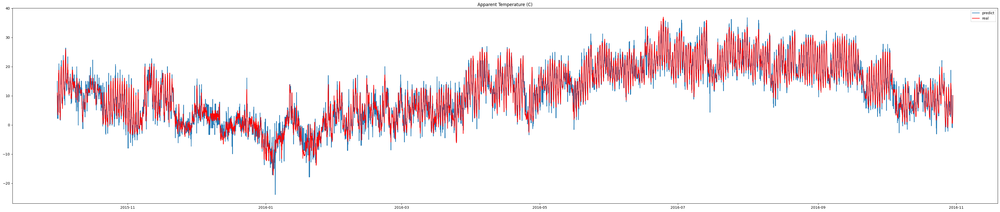

In [26]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[1:], predict_all_features[:,2], label='predict')
plt.plot(date_time[1:], val_all_features_y.iloc[:,2], c='red', label='real')
plt.title('Apparent Temperature (C)')
plt.legend()

### Humidity

In [27]:
# mean absolute error
humidity_mean = float(mean_absolute_error(val_all_features_y.iloc[:,3], predict_all_features[:,3]))
print('Độ lệch trung bình là: {:.3f}'.format(humidity_mean))

Độ lệch trung bình là: 0.113


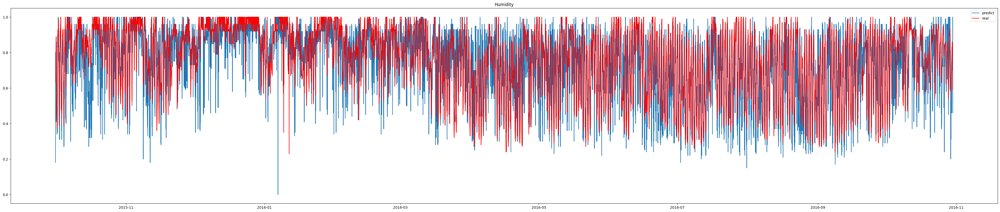

In [28]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[ 1:], predict_all_features[:,3], label='predict')
plt.plot(date_time[ 1:], val_all_features_y.iloc[:,3], c='red', label='real')
plt.title('Humidity')
plt.legend()

### Visibility

In [29]:
# mean absolute error
visibility_mean = float(mean_absolute_error(val_all_features_y.iloc[:,4], predict_all_features[:,4]))
print('Độ lệch trung bình là: {:.3f}'.format(visibility_mean))

Độ lệch trung bình là: 2.978


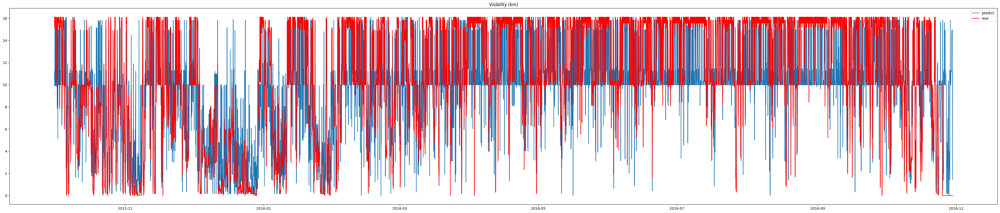

In [30]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[1:], predict_all_features[:,4], label='predict')
plt.plot(date_time[1:], val_all_features_y.iloc[:,4], c='red', label='real')
plt.title('Visibility (km)')
plt.legend()

### Pressure

In [31]:
# mean absolute error
pressure_mean = float(mean_absolute_error(val_all_features_y.iloc[:,5], predict_all_features[:,5]))
print('Độ lệch trung bình là: {:.3f}'.format(pressure_mean))

Độ lệch trung bình là: 2.099


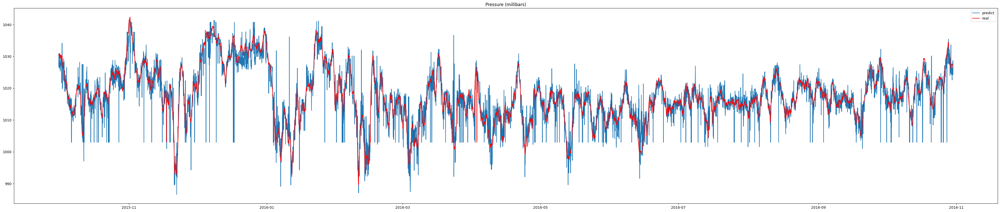

In [32]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[1:], predict_all_features[:,5], label='predict')
plt.plot(date_time[1:], val_all_features_y.iloc[:,5], c='red', label='real')
plt.title('Pressure (millibars)')
plt.legend()

### Summary

In [33]:
max_indices_pre = np.argmax(predict_all_features[:, 6:33], axis=1)
print(max_indices_pre)

[19 19 17 ... 17 12 17]


In [36]:
max_indices_test = np.argmax(val_all_features_y.iloc[:, 6:33], axis=1)
print(max_indices_test)

ValueError: Shape of passed values is (9495, 1), indices imply (9495, 27)

In [37]:
from sklearn.metrics import accuracy_score
summary_accuracy = accuracy_score( max_indices_test,max_indices_pre)

NameError: name 'max_indices_test' is not defined

In [38]:
# compute the confusion matrix
cm = confusion_matrix(max_indices_test,max_indices_pre)
 
#Plot the confusion matrix.

sns.heatmap(cm,
            annot=True,
            fmt='g',
            linewidths= 0.2,
            annot_kws={"size": 6})
# plt.figure(figsize= (5, 5))
plt.xlabel('Actual',fontsize=13)
plt.ylabel('Predict',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)

plt.show()

NameError: name 'max_indices_test' is not defined

### Wind Speed (km/h) And Wind Bearing (degrees)

In [39]:
def convertWind(wx, wy):
    # Chuyển đổi Wx và Wy về 'Wind Speed (km/h)'
    w_speed = np.sqrt(wx**2 + wy**2)
   
    # Chuyển đổi Wx và Wy về 'Wind Bearing (degrees)'
    w_bearing = np.arctan2(wy, wx) * 180 / np.pi
    return w_speed, w_bearing

In [40]:
w_speed_test, w_bearing_test = convertWind(val_all_features_y.iloc[:,33], val_all_features_y.iloc[:,34])
w_speed_pred, w_bearing_pred = convertWind(predict_all_features[:,33], predict_all_features[:,34])

In [41]:
# mean absolute error
wind_speed_mean = float(mean_absolute_error(w_speed_test, w_speed_pred))
print('Độ lệch trung bình là: {:.3f}'.format(wind_speed_mean))

Độ lệch trung bình là: 4.274


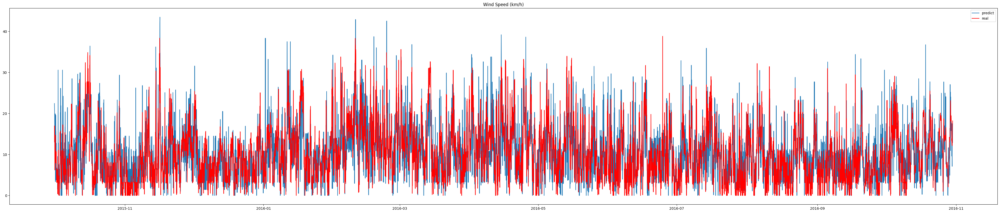

In [42]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[1:], w_speed_pred, label='predict')
plt.plot(date_time[1:], w_speed_test, c='red', label='real')
plt.title('Wind Speed (km/h)')
plt.legend()

In [43]:
# mean absolute error
wind_bearing_mean = float(mean_absolute_error(w_bearing_test, w_bearing_pred))
print('Độ lệch trung bình là: {:.3f}'.format(wind_bearing_mean))

Độ lệch trung bình là: 68.492


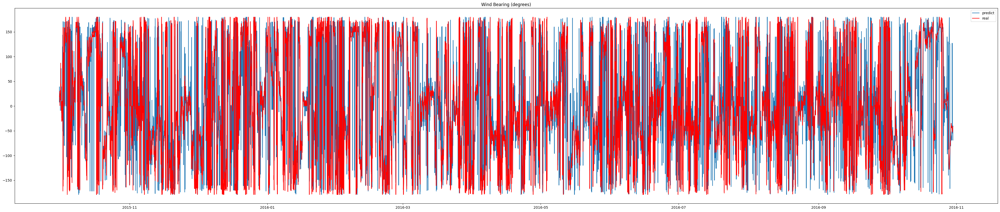

In [44]:
#visualization
plt.figure(figsize=(50,10))
plt.plot(date_time[1:], w_bearing_pred, label='predict')
plt.plot(date_time[1:], w_bearing_test, c='red', label='real')
plt.title('Wind Bearing (degrees)')
plt.legend()

### Tổng hợp

In [45]:
conclusion_sequence = pd.DataFrame({
    'Predict' : ['Nhiệt độ không khí', 'Nhiệt độ thực tế cảm nhận', 'Độ ẩm', 'Tầm nhìn', 'Áp suất', 'Vận tốc gió', 'Hướng gió'],
    'lệch với real data' : [temperature_mean,apparent_temperature_mean, humidity_mean, visibility_mean, pressure_mean, wind_speed_mean, wind_bearing_mean]
})

In [47]:
conclusion_sequence

,Predict,lệch với real data
0,Nhiệt độ không khí,1.627325
1,Nhiệt độ thực tế cảm nhận,1.897069
2,Độ ẩm,0.112633
3,Tầm nhìn,2.978002
4,Áp suất,2.098756
5,Vận tốc gió,4.273531
6,Hướng gió,68.492085


In [48]:
conclusion_fragmentation = pd.DataFrame({
    'Predict' : ['Mưa' ],
    'Độ chính xác' : [str(round(R_Accuracy,2)*100) + "%"]
})

In [49]:
conclusion_fragmentation

,Predict,Độ chính xác
0,Mưa,97.0%


## Some important features

In [17]:
features = ['Temperature (C)', 'Apparent Temperature (C)', 'Humidity', 'Visibility (km)', 'Pressure (millibars)']

## Evaluate them

Độ lệch trung bình của Temperature (C) là: 1.037
Biểu đồ:


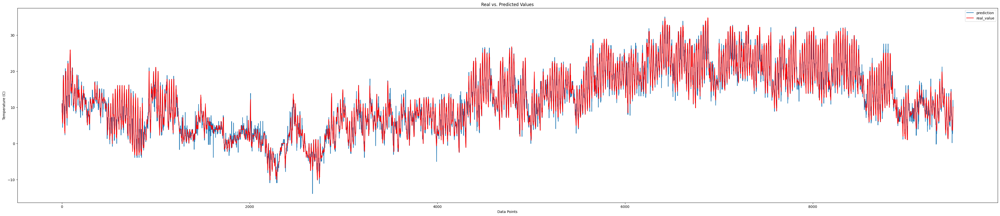

Độ lệch trung bình của Apparent Temperature (C) là: 1.309
Biểu đồ:


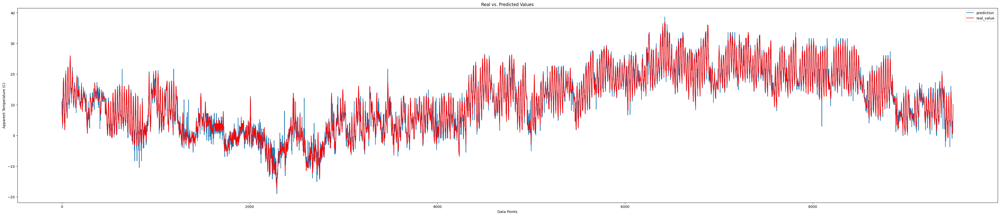

Độ lệch trung bình của Humidity là: 0.053
Biểu đồ:


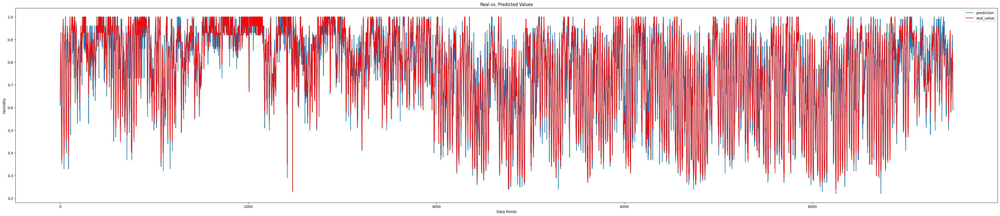

Độ lệch trung bình của Visibility (km) là: 2.416
Biểu đồ:


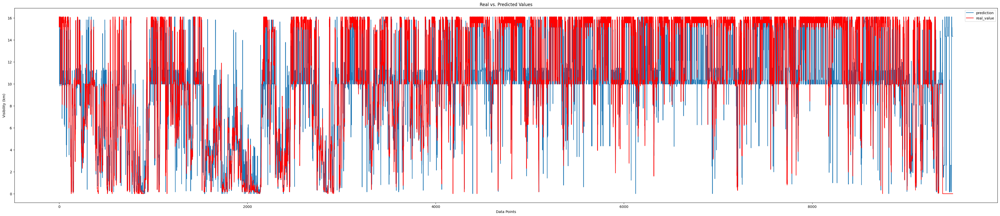

Độ lệch trung bình của Pressure (millibars) là: 0.947
Biểu đồ:


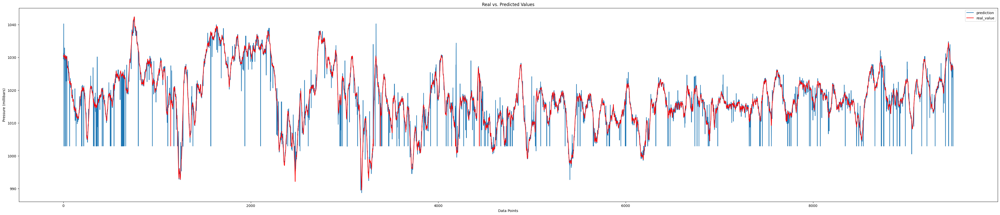

In [18]:
for i in range(0, ft_len):
   ft_name = feature_name[i]
   if ft_name in features:
      predict = models[i].predict(val_X)
      mean = float(mean_absolute_error(val_y[i], predict))
      print(f'Độ lệch trung bình của {ft_name} là: {mean:.3f}')
      print('Biểu đồ:')
      plt.figure(figsize=(50,10))
      plt.plot(predict, label='prediction')     
      plt.plot(val_y[i], c='red', label='real_value') 
      plt.xlabel('Data Points')
      plt.ylabel(ft_name)
      plt.title('Real vs. Predicted Values')
      plt.legend()
      plt.show()